##Mask Detection

---
The goal of this challenge is to build a model that can detect whether a person is wearing a mask or not. You would be downloading the data from kaggle and then building you model while we guide you through the steps.


##Getting the Data

We start by getting the data. The data that we want is on kaggle and you can access it through this link: https://www.kaggle.com/omkargurav/face-mask-dataset What you will have to do, is to search for a way that allows you to download the dataset from kaggle directly into google colab (or your google drive). This process would save you the trouble from downloading the dataset locally and then uploading it to use it in colab.

In [1]:
#https://www.analyticsvidhya.com/blog/2021/06/how-to-load-kaggle-datasets-directly-into-google-colab/
#kaggle datasets download -d omkargurav/face-mask-dataset
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
#download the competitions datasets
! kaggle datasets download -d omkargurav/face-mask-dataset


 89% 146M/163M [00:00<00:00, 207MB/s]
100% 163M/163M [00:00<00:00, 220MB/s]


Once the dataset is downloaded, it is going to be zipped, and in order to use it, you need to unzip it. Here you have the option of unzipping it in the environment or in your google drive.

In [2]:
! unzip face-mask-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: data/with_mask/with_mask_3297.jpg  
  inflating: data/with_mask/with_mask_3298.jpg  
  inflating: data/with_mask/with_mask_3299.jpg  
  inflating: data/with_mask/with_mask_33.jpg  
  inflating: data/with_mask/with_mask_330.jpg  
  inflating: data/with_mask/with_mask_3300.jpg  
  inflating: data/with_mask/with_mask_3301.jpg  
  inflating: data/with_mask/with_mask_3302.jpg  
  inflating: data/with_mask/with_mask_3303.jpg  
  inflating: data/with_mask/with_mask_3304.jpg  
  inflating: data/with_mask/with_mask_3305.jpg  
  inflating: data/with_mask/with_mask_3306.jpg  
  inflating: data/with_mask/with_mask_3307.jpg  
  inflating: data/with_mask/with_mask_3308.jpg  
  inflating: data/with_mask/with_mask_3309.jpg  
  inflating: data/with_mask/with_mask_331.jpg  
  inflating: data/with_mask/with_mask_3310.jpg  
  inflating: data/with_mask/with_mask_3311.jpg  
  inflating: data/with_mask/with_mask_3312.jpg  
  inflating: data/with

##Importing the Libraries

Now, it is time to import the libraries that we need. 

In [3]:
import os
import shutil
import random
import numpy as np
from matplotlib import pyplot as plt
import tensorflow as tf
import cv2

If we look at the data that we extracted, we can see that it is located in 2 folders: with_mask and without_mask. What we need to do now, is to create a hierarchy of folders that would help us specify the training, validation, and testing data. In order to do this you have to use the **os** and the **shutil** libraries that would help you creating folders, and moving images from a folder to another. In simple terms, the libraries helps you perform the same things that you do on your computer with your operating system, but in a programmatic way.

The initial dataset contains a lot of images belonging to the 2 classes, what we will do is randomly sample from this dataset so that we reduce the training and the tuning time. 

We need to have in our final directories the following:
* Training: 500 images "with_mask", and 500 images "without_mask"
* Validation: 100 images "with_mask", and 100 images "without_mask"
* Testing: 50 images "with_mask", and 50 images "without_mask"

In [4]:
#https://stackoverflow.com/questions/53074712/how-to-split-folder-of-images-into-test-training-validation-sets-with-stratified
#https://www.kaggle.com/questions-and-answers/102677


In [5]:
#Test Your Zaka --- Create the Train, Validation and Testing Folder
os.mkdir("/content/dataset")

In [6]:
os.mkdir("/content/dataset/train")
os.mkdir("/content/dataset/test")
os.mkdir("/content/dataset/validation")
#Test Your Zaka --- Create the classes folders inside of each folder you created above
os.mkdir("/content/dataset/train/with_mask")
os.mkdir("/content/dataset/train/without_mask")

os.mkdir("/content/dataset/test/with_mask")
os.mkdir("/content/dataset/test/without_mask")

os.mkdir("/content/dataset/validation/with_mask")
os.mkdir("/content/dataset/validation/without_mask")

In [7]:
#Test Your Zaka --- For each class, take the images, and select 500 samples for training and 100 for evaluation, and 50 for testing

#0 without_mask
#1 with_mask
data_root = "/content/data"
source_0 = data_root + "/without_mask"
source_1 = data_root + "/with_mask"
files_list_0 = []
files_list_1 = []

for root, dirs, files in os.walk(source_0):
    for file in files:
      files_list_0.append(os.path.join(root, file))

for root, dirs, files in os.walk(source_1):
    for file in files:
      files_list_1.append(os.path.join(root, file))

#list img
#files_0 = os.listdir(files_list_0)
#files_1 = os.listdir(source_1)

#randomly subset the data

rand_subSet_0 = random.sample(files_list_0, 500)
rand_subSet_1 = random.sample(files_list_1, 500)

In [8]:
#train

train_path="/content/dataset/train"

for file in rand_subSet_0:
  shutil.move(file, train_path + "/without_mask/")

for file in rand_subSet_1:
  shutil.move(file, train_path + "/with_mask/")

In [9]:
test_files_list_0 = []
test_files_list_1 = []

#as before we moved the data from the source folder, to avoid picking the same moved file name we create a new list to render the new dataset
for root, dirs, files in os.walk(source_0):
    for file in files:
      test_files_list_0.append(os.path.join(root, file))

for root, dirs, files in os.walk(source_1):
    for file in files:
      test_files_list_1.append(os.path.join(root, file))

rand_subSet_0_test = random.sample(test_files_list_0, 50)
rand_subSet_1_test = random.sample(test_files_list_1, 50)

test_path="/content/dataset/test"

for file in rand_subSet_0_test:
  shutil.move(file, test_path + "/without_mask/")

for file in rand_subSet_1_test:
  shutil.move(file, test_path + "/with_mask/")

In [10]:
val_files_list_0 = []
val_files_list_1 = []

#as before we moved the data from the source folder, to avoid picking the same moved file name we create a new list to render the new dataset
for root, dirs, files in os.walk(source_0):
    for file in files:
      val_files_list_0.append(os.path.join(root, file))

for root, dirs, files in os.walk(source_1):
    for file in files:
      val_files_list_1.append(os.path.join(root, file))

rand_subSet_0_val = random.sample(val_files_list_0, 100)
rand_subSet_1_val = random.sample(val_files_list_1, 100)

val_path="/content/dataset/validation"

for file in rand_subSet_0_val:
  shutil.move(file, val_path + "/without_mask/")

for file in rand_subSet_1_val:
  shutil.move(file, val_path + "/with_mask/")

##Inspecting the Dataset

Now we will see some characteristics of our dataset.

Define 3 variables: **training_path**, **validation_path**, and **testing_path** so that you can use them for the rest of the colab.

In [11]:
training_path = "/content/dataset/train"
validation_path= "/content/dataset/validation"
testing_path = "/content/dataset/test"

To make sure that everythinh went correctly, write a code that counts the number of images that you have in your training directory for each of the 2 categories: with_mask and without_mask

In [12]:
print("train-with_mask", len(os.listdir(training_path + '/with_mask')))
print("train-without_mask", len(os.listdir(training_path + '/with_mask')))

train-with_mask 500
train-without_mask 500


Do the same for the validation and the testing folders

In [13]:
print("validation-with_mask", len(os.listdir(validation_path + '/with_mask')))
print("validation-without_mask", len(os.listdir(validation_path + '/without_mask')))

validation-with_mask 100
validation-without_mask 100


In [14]:
print("test-with_mask", len(os.listdir(testing_path + '/with_mask')))
print("test-without_mask", len(os.listdir(testing_path + '/without_mask')))

test-with_mask 50
test-without_mask 50


Write a code that shows 5 random images for people with mask from your training set. 

/content/dataset/train/with_mask/with_mask_1753.jpg


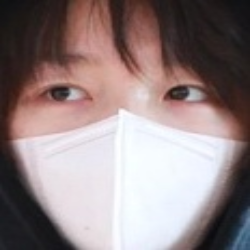

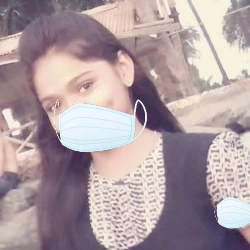

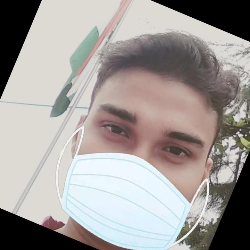

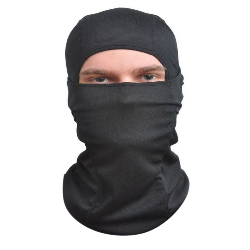

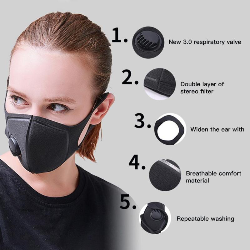

In [15]:
from google.colab.patches import cv2_imshow

train_set_1 =[]
source_train_set_1 = training_path + '/with_mask'

for root, dirs, files in os.walk(source_train_set_1):
    for file in files:
      train_set_1.append(os.path.join(root, file))

rand_mask = random.sample(train_set_1, 5)
print(rand_mask[0])
for i in rand_mask:
  img = cv2.imread(i,cv2.IMREAD_COLOR)
  resized_img = cv2.resize(img, (250, 250))
  cv2_imshow(resized_img)

Do the same for people without mask.

/content/dataset/train/without_mask/without_mask_2813.jpg


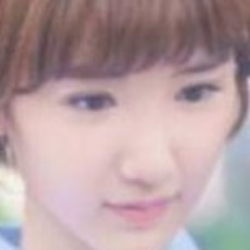

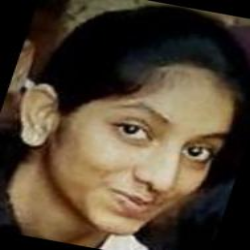

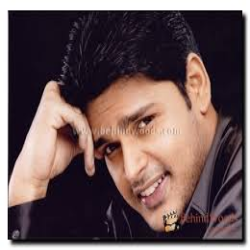

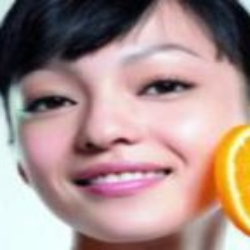

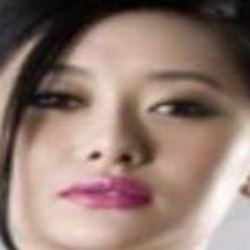

In [16]:
train_set_0 =[]
source_train_set_0 = training_path + '/without_mask'

for root, dirs, files in os.walk(source_train_set_0):
    for file in files:
      train_set_0.append(os.path.join(root, file))

rand_mask = random.sample(train_set_0, 5)
print(rand_mask[0])
for i in rand_mask:
  img = cv2.imread(i,cv2.IMREAD_COLOR)
  resized_img = cv2.resize(img, (250, 250))
  cv2_imshow(resized_img)

##Modeling

Define a model structure that can deal with the images that we have to classify them between the 2 classes.

In [17]:
#Test Your Zaka
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, AveragePooling2D, Flatten

#Because we have A good number of data, themn normalize it 
datagen = ImageDataGenerator(rescale=1.0/255.0,width_shift_range=0.5,horizontal_flip=True,vertical_flip=True,validation_split=0.15)
test_datagen = ImageDataGenerator(rescale=1.0/255.0,width_shift_range=0.5, height_shift_range=0.2, zoom_range=0.2, fill_mode='nearest' ,horizontal_flip=True,vertical_flip=True,validation_split=0.15)

train_it = datagen.flow_from_directory(training_path, batch_size=50, target_size=(128, 128),shuffle=True, class_mode="binary") 

test_it = test_datagen.flow_from_directory(testing_path, class_mode="binary", target_size=(128, 128), shuffle=True, batch_size=3)

eval_it = datagen.flow_from_directory(validation_path, batch_size=10, target_size=(128, 128),shuffle=True, class_mode="binary")

model = Sequential()
model.add(Conv2D(4, (3,3), input_shape=(128, 128, 3), activation="relu"))

model.add(AveragePooling2D())
model.add(Conv2D(32, (3,3), activation="relu"))
model.add(AveragePooling2D())
model.add(Conv2D(32, (3,3), activation="relu"))
model.add(AveragePooling2D())

model.add(Flatten())
model.add(Dense(50, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

print(model.summary())


Found 1000 images belonging to 2 classes.
Found 100 images belonging to 2 classes.
Found 200 images belonging to 2 classes.
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 4)       112       
                                                                 
 average_pooling2d (AverageP  (None, 63, 63, 4)        0         
 ooling2D)                                                       
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        1184      
                                                                 
 average_pooling2d_1 (Averag  (None, 30, 30, 32)       0         
 ePooling2D)                                                     
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 32)        9248     

Train the model that you defined on the training data and evaluate it on the validation data. Feel free to tune the hyperparameters of your model until you reach a satisfying result on the validation set. </br>
**N.B:** Make sure to save the model training history in a variable to plot later the learning curve.

In [18]:
#Test Your Zaka
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])
# we used Just the accurecy metrics because the data is balanced

trained_model = model.fit(train_it, epochs=50, steps_per_epoch=10, validation_data=eval_it)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


Epoch 1/50
10/10 [==============================] - 20s 527ms/step - loss: 0.7029 - accuracy: 0.5100 - precision: 0.5211 - recall: 0.7115 - val_loss: 0.6913 - val_accuracy: 0.5000 - val_precision: 0.5000 - val_recall: 1.0000
Epoch 2/50
10/10 [==============================] - 5s 559ms/step - loss: 0.6812 - accuracy: 0.5200 - precision: 0.5143 - recall: 0.9882 - val_loss: 0.6748 - val_accuracy: 0.5100 - val_precision: 0.5051 - val_recall: 0.9900
Epoch 3/50
10/10 [==============================] - 5s 494ms/step - loss: 0.6556 - accuracy: 0.5820 - precision: 0.5550 - recall: 0.8446 - val_loss: 0.6499 - val_accuracy: 0.6150 - val_precision: 0.7091 - val_recall: 0.3900
Epoch 4/50
10/10 [==============================] - 5s 530ms/step - loss: 0.6210 - accuracy: 0.6920 - precision: 0.7009 - recall: 0.6613 - val_loss: 0.6344 - val_accuracy: 0.6500 - val_precision: 0.7206 - val_recall: 0.4900
Epoch 5/50
10/10 [==============================] - 5s 527ms/step - loss: 0.5945 - accuracy: 0.6780 - p

Plot the accuracy curve and see if your model is overfit.

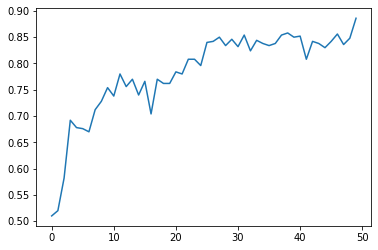

In [19]:
#Test Your Zaka
plt.plot(trained_model.history["accuracy"])

Text(0, 0.5, 'Accuracy')

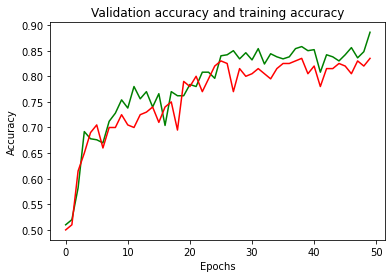

In [20]:
plt.plot(trained_model.history["accuracy"],color='g')
plt.plot(trained_model.history["val_accuracy"],color='r')
plt.title("Validation accuracy and training accuracy")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

Text(0, 0.5, 'loss')

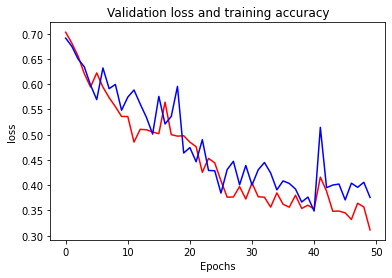

In [21]:
plt.plot(trained_model.history["loss"],color='r')
plt.plot(trained_model.history["val_loss"],color='b')
plt.title("Validation loss and training accuracy")
plt.xlabel('Epochs')
plt.ylabel('loss')

**[Because the Model at Training has Accuracy of 0.8860 and the validation accuracy is 0.8350 then the model is not overfit!]**

##Evaluate the model


Now you will evaluate the model that you built on the testing set that you kept aside since the beginning.

In [22]:
pred = model.predict_generator(test_it, steps= len(test_it))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  """Entry point for launching an IPython kernel.


/content/dataset/test/without_mask
/without_mask : /without_mask  :  [[0.8540064]]
/without_mask : /without_mask  :  [[0.4552772]]
/without_mask : /without_mask  :  [[0.7256324]]
/without_mask : /without_mask  :  [[0.37383208]]
/without_mask : /without_mask  :  [[0.8468513]]
/without_mask : /without_mask  :  [[0.6281773]]
/without_mask : /without_mask  :  [[0.96151114]]
/without_mask : /without_mask  :  [[0.69516635]]
/without_mask : /without_mask  :  [[0.9534921]]
/without_mask : /without_mask  :  [[0.7843544]]
/without_mask : /without_mask  :  [[0.743481]]
/without_mask : /without_mask  :  [[0.8495167]]
/without_mask : /without_mask  :  [[0.8164593]]
/without_mask : /without_mask  :  [[0.6878365]]
/without_mask : /without_mask  :  [[0.96264964]]
/without_mask : /without_mask  :  [[0.97100544]]
/without_mask : /without_mask  :  [[0.22454977]]
/without_mask : /without_mask  :  [[0.96395695]]
/without_mask : /without_mask  :  [[0.77754456]]
/without_mask : /without_mask  :  [[0.76374453

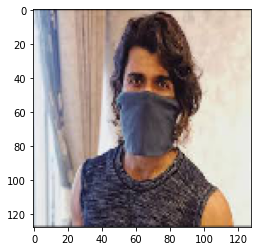

In [23]:
#0 without_mask
#1 with_mask
from keras.preprocessing import image
p_list = []
classes = ['/without_mask', '/with_mask']
for c in classes:
    aktdir=testing_path+c
    print(aktdir)
    for filename in os.listdir(aktdir):
        fn=os.path.join(aktdir, filename)
        #print(fn)
        img = image.load_img(fn, target_size=(128, 128))
        plt.imshow(img)
       # plt.show()

        x = image.img_to_array(img)
        x = x.astype('float32')
        x /= 255
        x = np.expand_dims(x, axis=0)
        #x = preprocess_input(x)

        prediction = model.predict(x)
        

        #print(prediction)
        if aktdir=='/content/dataset/test/without_mask':
          print(c + " : " + classes[np.argmax(prediction)], " : ", prediction)
          p_list.append(prediction)
        else:
          print(c + " : " + 'with_mask' , " : " , 1-prediction)
          p_list.append(1-prediction)

In [24]:
def get_class(prediction):
  pred_list = []
  for p in prediction:
    if p[0] >= 0.5:
      pred_list.append(1)
    else:
      pred_list.append(0)
  return pred_list

Now we want to visualize the confusion matrix in order to see how much our classifier is good in predicting different classes.

In [25]:
from sklearn.metrics import classification_report, confusion_matrix

predicted_classes =  get_class(p_list)
print('Confusion Matrix')
#print(confusion_matrix(test_it.classes, predicted_classes))
print('Classification Report')
#target_names = ['with_mask', 'without_mask']
true_classes = test_it.classes
class_labels = list(test_it.class_indices.keys())  
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)  

Confusion Matrix
Classification Report
              precision    recall  f1-score   support

   with_mask       0.83      0.20      0.32        50
without_mask       0.55      0.96      0.70        50

    accuracy                           0.58       100
   macro avg       0.69      0.58      0.51       100
weighted avg       0.69      0.58      0.51       100



**What did you learn about your model from this confusion matrix?**

**[by checking the images, we found some with wrong pridictions, so the model should Extract more features to increase the performance, the model predict the mask images better than the with-out mask images]**

##Error Analysis

Now we need to see for each of the images that we have in our testing set, what did the model predict. This helps us analyze the errors and try to think why the model predicted some things in the wrong way.

/content/dataset/test/without_mask


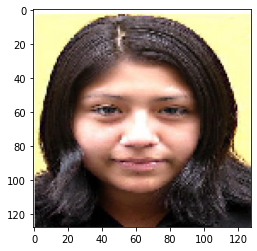

/without_mask : /without_mask  :  [[0.8540064]]


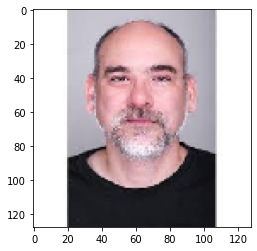

/without_mask : /without_mask  :  [[0.4552772]]


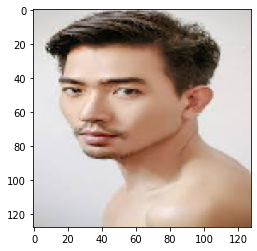

/without_mask : /without_mask  :  [[0.7256324]]


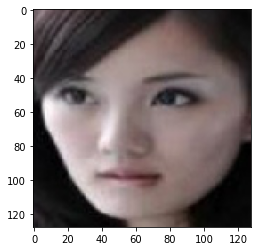

/without_mask : /without_mask  :  [[0.37383208]]


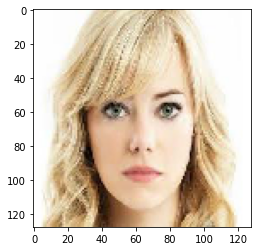

/without_mask : /without_mask  :  [[0.8468513]]


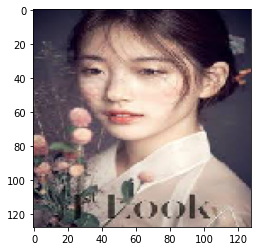

/without_mask : /without_mask  :  [[0.6281773]]


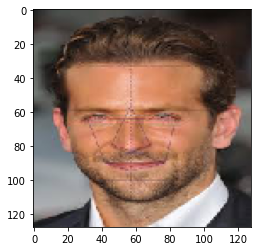

/without_mask : /without_mask  :  [[0.96151114]]


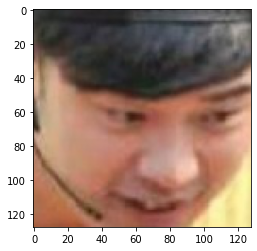

/without_mask : /without_mask  :  [[0.69516635]]


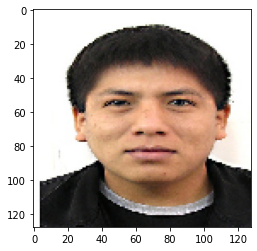

/without_mask : /without_mask  :  [[0.9534921]]


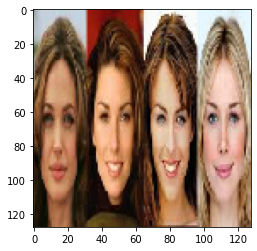

/without_mask : /without_mask  :  [[0.7843544]]


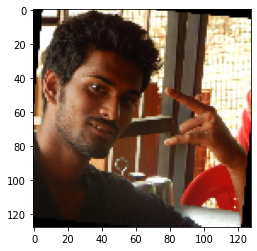

/without_mask : /without_mask  :  [[0.743481]]


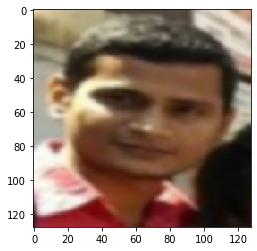

/without_mask : /without_mask  :  [[0.8495167]]


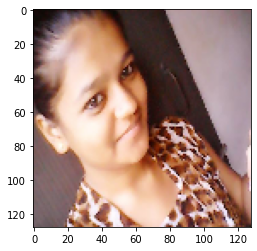

/without_mask : /without_mask  :  [[0.8164593]]


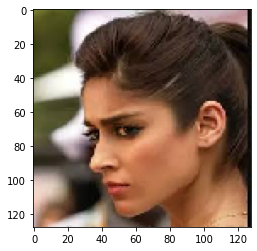

/without_mask : /without_mask  :  [[0.6878365]]


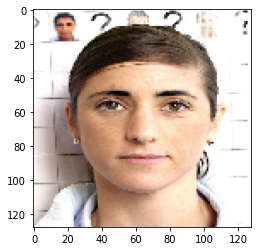

/without_mask : /without_mask  :  [[0.96264964]]


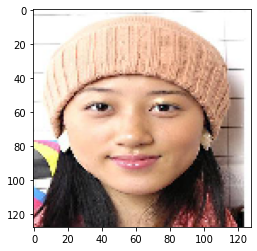

/without_mask : /without_mask  :  [[0.97100544]]


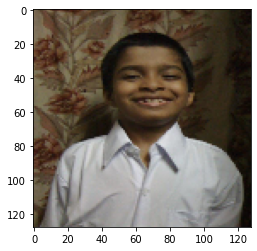

/without_mask : /without_mask  :  [[0.22454977]]


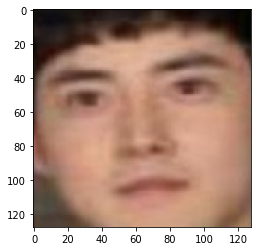

/without_mask : /without_mask  :  [[0.96395695]]


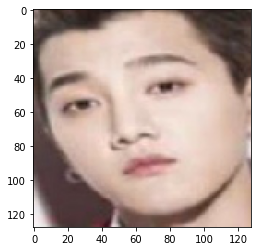

/without_mask : /without_mask  :  [[0.77754456]]


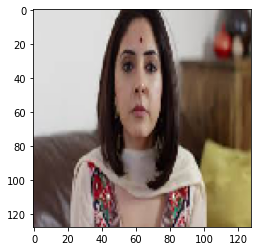

/without_mask : /without_mask  :  [[0.76374453]]


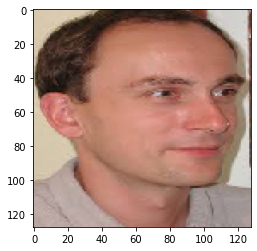

/without_mask : /without_mask  :  [[0.9790324]]


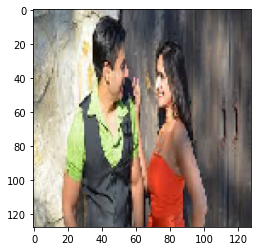

/without_mask : /without_mask  :  [[0.58645135]]


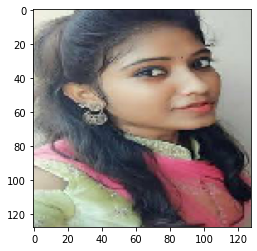

/without_mask : /without_mask  :  [[0.4069017]]


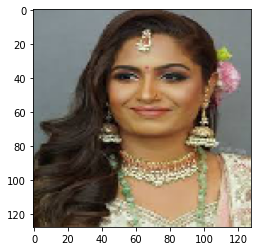

/without_mask : /without_mask  :  [[0.7890035]]


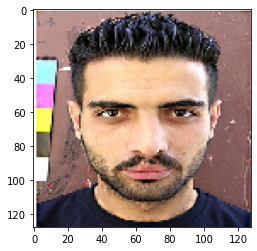

/without_mask : /without_mask  :  [[0.88997793]]


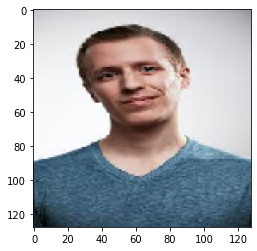

/without_mask : /without_mask  :  [[0.25940403]]


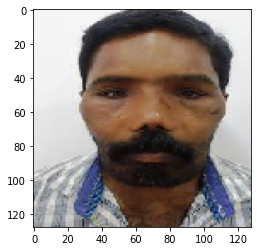

/without_mask : /without_mask  :  [[0.5536901]]


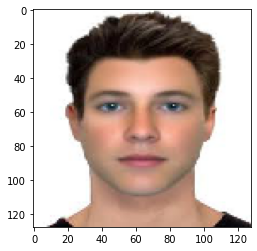

/without_mask : /without_mask  :  [[0.94523925]]


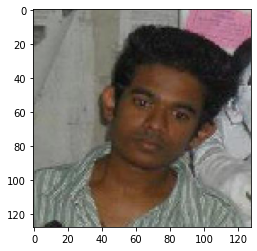

/without_mask : /without_mask  :  [[0.59528995]]


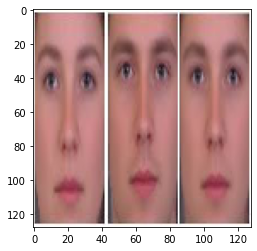

/without_mask : /without_mask  :  [[0.8364144]]


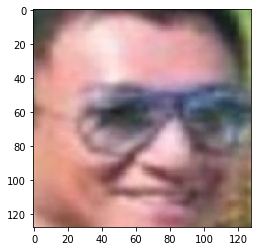

/without_mask : /without_mask  :  [[0.05128971]]


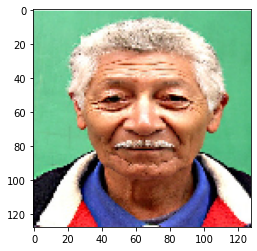

/without_mask : /without_mask  :  [[0.6903626]]


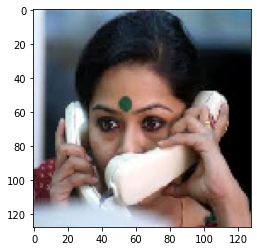

/without_mask : /without_mask  :  [[0.6620288]]


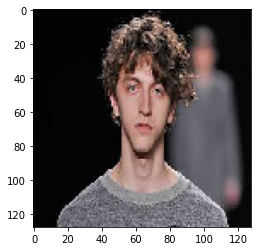

/without_mask : /without_mask  :  [[0.79274446]]


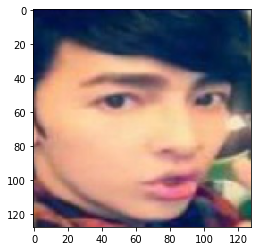

/without_mask : /without_mask  :  [[0.9816743]]


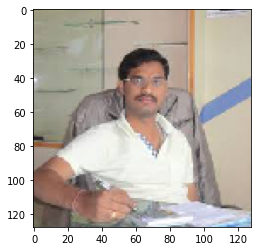

/without_mask : /without_mask  :  [[0.09576772]]


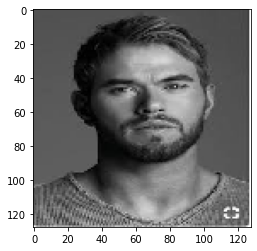

/without_mask : /without_mask  :  [[0.196815]]


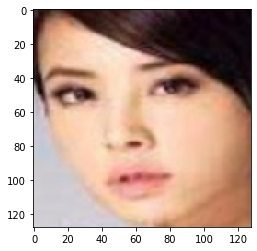

/without_mask : /without_mask  :  [[0.9404131]]


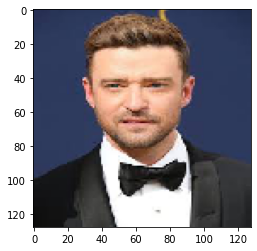

/without_mask : /without_mask  :  [[0.29644215]]


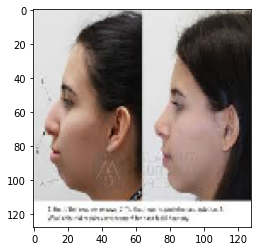

/without_mask : /without_mask  :  [[0.22984825]]


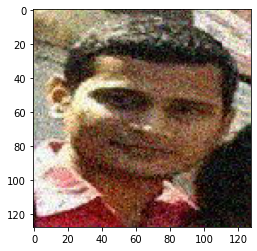

/without_mask : /without_mask  :  [[0.7971305]]


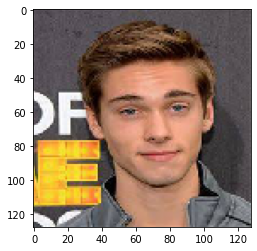

/without_mask : /without_mask  :  [[0.87291175]]


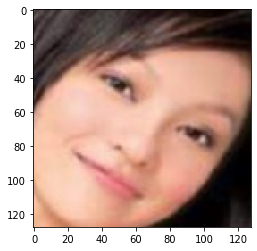

/without_mask : /without_mask  :  [[0.96905833]]


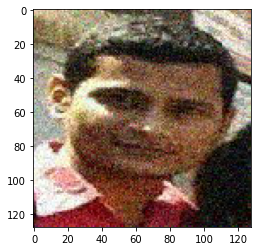

/without_mask : /without_mask  :  [[0.7962057]]


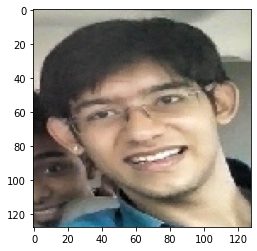

/without_mask : /without_mask  :  [[0.6494499]]


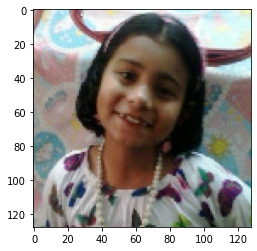

/without_mask : /without_mask  :  [[0.684045]]


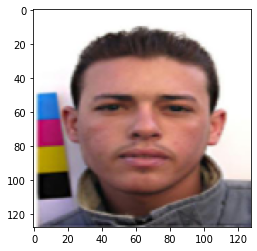

/without_mask : /without_mask  :  [[0.95608276]]


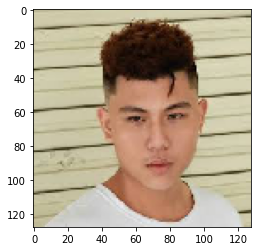

/without_mask : /without_mask  :  [[0.8770629]]


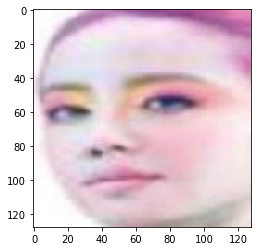

/without_mask : /without_mask  :  [[0.7759492]]


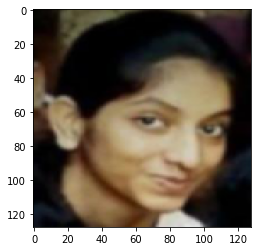

/without_mask : /without_mask  :  [[0.93036187]]
/content/dataset/test/with_mask


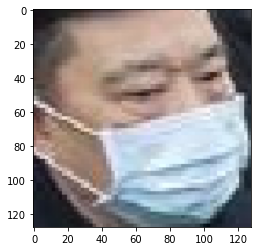

/with_mask : with_mask  :  [[0.72531724]]


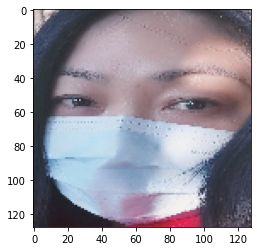

/with_mask : with_mask  :  [[0.98303956]]


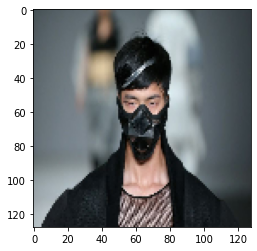

/with_mask : with_mask  :  [[0.91387826]]


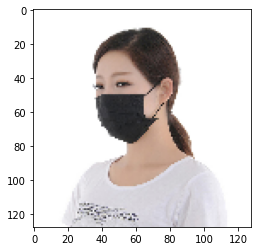

/with_mask : with_mask  :  [[0.68639433]]


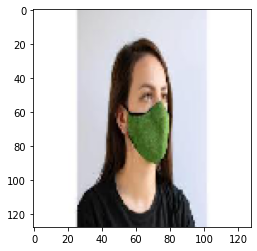

/with_mask : with_mask  :  [[0.73362166]]


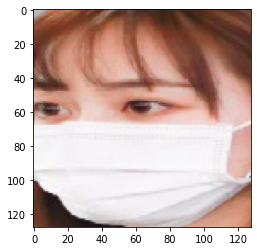

/with_mask : with_mask  :  [[0.9874628]]


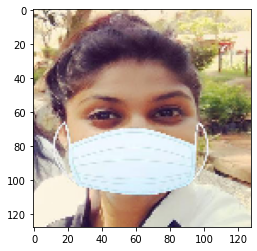

/with_mask : with_mask  :  [[0.9252482]]


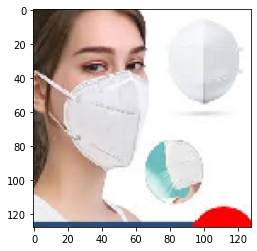

/with_mask : with_mask  :  [[0.71585965]]


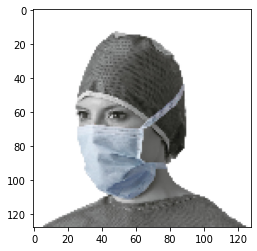

/with_mask : with_mask  :  [[0.85442877]]


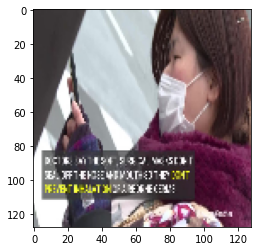

/with_mask : with_mask  :  [[0.3954882]]


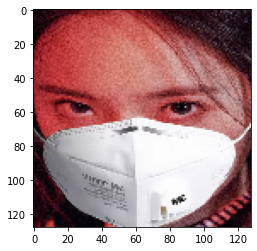

/with_mask : with_mask  :  [[0.9827111]]


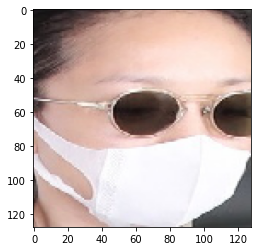

/with_mask : with_mask  :  [[0.3420198]]


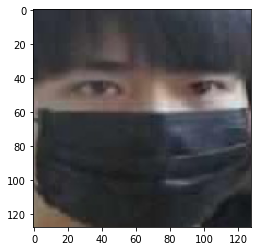

/with_mask : with_mask  :  [[0.9537687]]


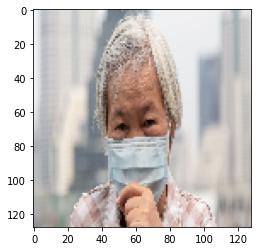

/with_mask : with_mask  :  [[0.8550548]]


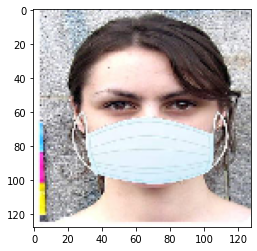

/with_mask : with_mask  :  [[0.9917457]]


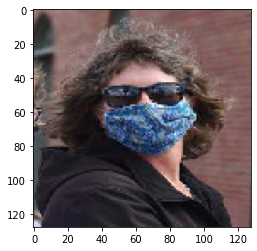

/with_mask : with_mask  :  [[0.92082816]]


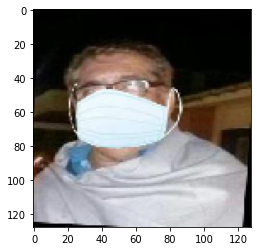

/with_mask : with_mask  :  [[0.910332]]


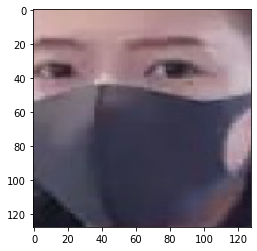

/with_mask : with_mask  :  [[0.9675367]]


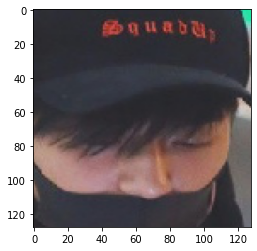

/with_mask : with_mask  :  [[0.9990096]]


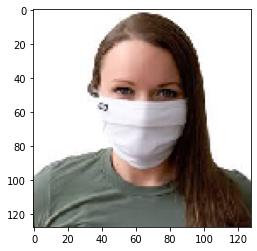

/with_mask : with_mask  :  [[0.95674425]]


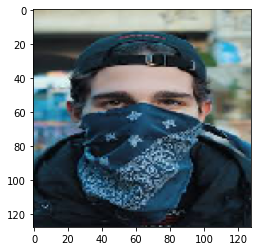

/with_mask : with_mask  :  [[0.9566749]]


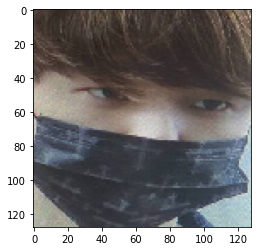

/with_mask : with_mask  :  [[0.9506709]]


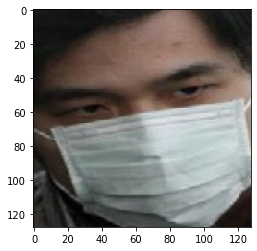

/with_mask : with_mask  :  [[0.9826589]]


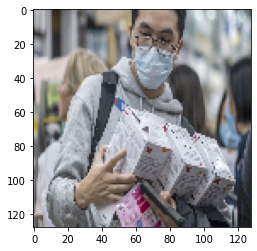

/with_mask : with_mask  :  [[0.86629486]]


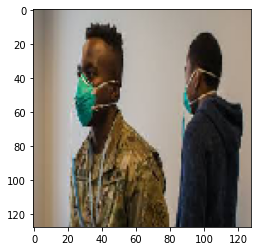

/with_mask : with_mask  :  [[0.7968758]]


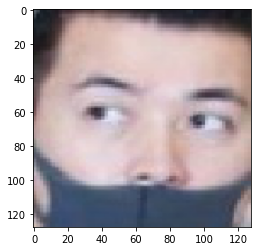

/with_mask : with_mask  :  [[0.8699659]]


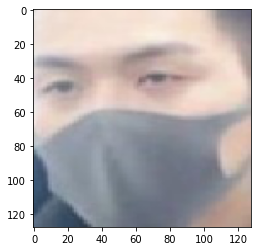

/with_mask : with_mask  :  [[0.9886494]]


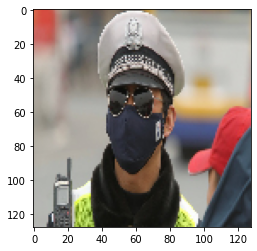

/with_mask : with_mask  :  [[0.73475266]]


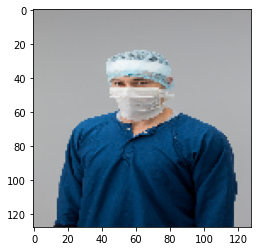

/with_mask : with_mask  :  [[0.89898014]]


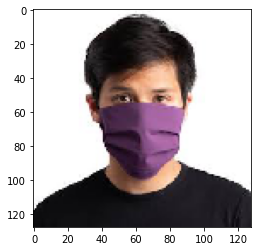

/with_mask : with_mask  :  [[0.93731683]]


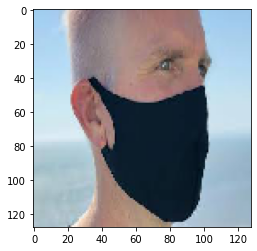

/with_mask : with_mask  :  [[0.96064323]]


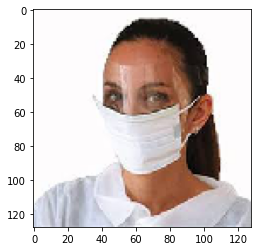

/with_mask : with_mask  :  [[0.9276071]]


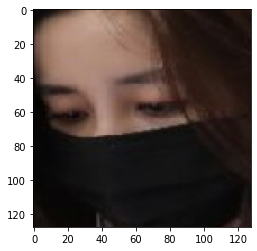

/with_mask : with_mask  :  [[0.761698]]


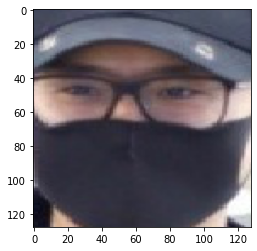

/with_mask : with_mask  :  [[0.9089134]]


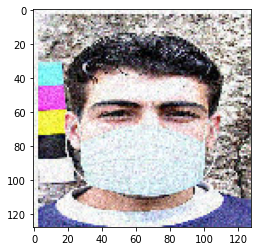

/with_mask : with_mask  :  [[0.8275478]]


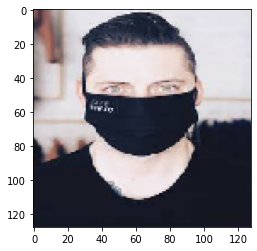

/with_mask : with_mask  :  [[0.8016465]]


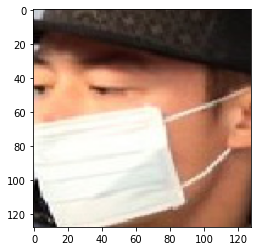

/with_mask : with_mask  :  [[0.92940354]]


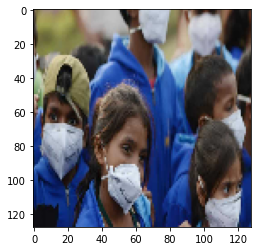

/with_mask : with_mask  :  [[0.7472806]]


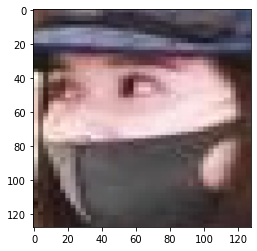

/with_mask : with_mask  :  [[0.8604971]]


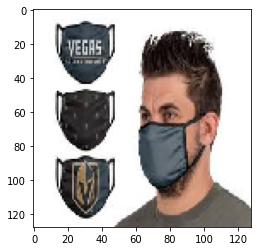

/with_mask : with_mask  :  [[0.70207536]]


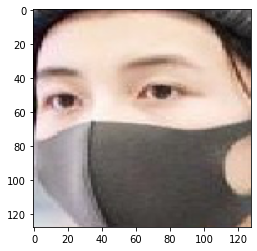

/with_mask : with_mask  :  [[0.9624232]]


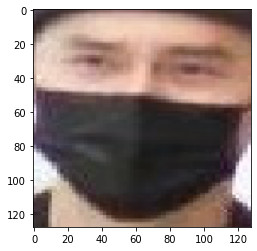

/with_mask : with_mask  :  [[0.9981748]]


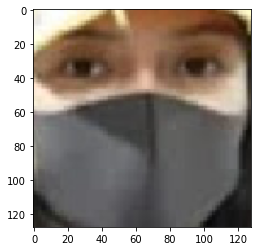

/with_mask : with_mask  :  [[0.99332076]]


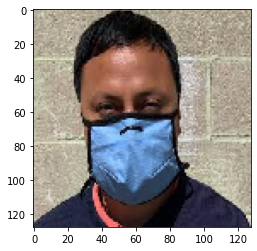

/with_mask : with_mask  :  [[0.9809122]]


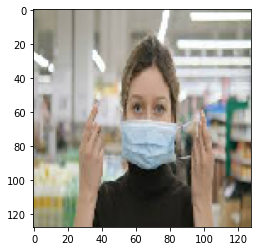

/with_mask : with_mask  :  [[0.7992272]]


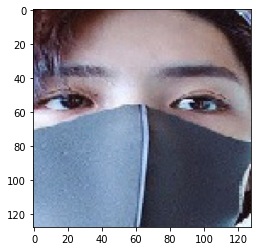

/with_mask : with_mask  :  [[0.9581977]]


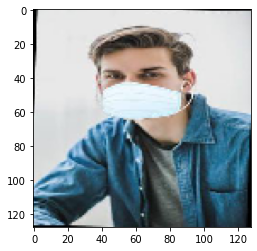

/with_mask : with_mask  :  [[0.9737626]]


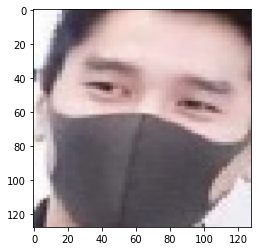

/with_mask : with_mask  :  [[0.89775634]]


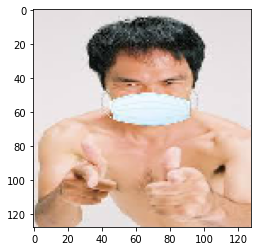

/with_mask : with_mask  :  [[0.99135715]]


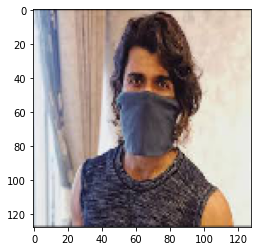

/with_mask : with_mask  :  [[0.91995287]]


In [26]:
#Test Your Zaka
#0 without_mask
#1 with_mask
from keras.preprocessing import image
classes = ['/without_mask', '/with_mask']
for c in classes:
    aktdir=testing_path+c
    print(aktdir)
    for filename in os.listdir(aktdir):
        fn=os.path.join(aktdir, filename)
        #print(fn)
        img = image.load_img(fn, target_size=(128, 128))
        plt.imshow(img)
        plt.show()

        x = image.img_to_array(img)
        x = x.astype('float32')
        x /= 255
        x = np.expand_dims(x, axis=0)
        #x = preprocess_input(x)

        prediction = model.predict(x)
        
        #print(prediction)
        if aktdir=='/content/dataset/test/without_mask':
          print(c + " : " + classes[np.argmax(prediction)], " : ", prediction)
        else:
          print(c + " : " + 'with_mask' , " : " , 1-prediction)

**Try to derive some conclusions from the wrong predictions that your model has made. Meaning: why do you think these predictions were wrong?**

**- low image resolution has negative effect on the model prediction** 

**- We assumed that all the images are GBR, so the images with other color format type got negative effect on the model prediction**

**- Need more Feature extraction as some images have close feature to the other class**

**- Prediction get effected negatively with the noise data (bad data)**  


**Think of a way that you can use in order to improve the performance of your model, and implement it**


**- low resolution effect => use data with higher resolution or decrease the target_size in the model**

**- Image Format type => implment a predection for th image format**

**- Image wrongly predected to the other class=> Use more feature extraction by increase kernels, convolutional and pooling, and adding more hidden layers**




**Your Friend took your code and ran it again, but obtained different accuracies on the different sets. How do you interpret this?**

**the other build result for the model [accuracy: 0.8380 - precision: 0.8680 - recall: 0.8189 - val_loss: 0.2985 - val_accuracy: 0.8700 - val_precision: 0.8936 - val_recall: 0.8400]**

**This changes is from the random selection of the data sets**

**Also, because the accurecy metrics close to each other, then the model didn't overfit**